In [1]:
import os
import json
import open3d as o3d
import numpy as np
import vispy
from vispy import io
import torch
from torch import tensor
import math
import random
import numbers
import torch.optim as optim
import torch.nn.functional as F

from torch_geometric.data import Data
from torch_cluster import fps
from torch_geometric.transforms import Compose, RandomRotate
from torch_cluster import knn_graph
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops, degree
from scipy.optimize import linear_sum_assignment as linear_assignment

In [26]:
# Helper functions for visualization.
%matplotlib inline
import matplotlib.pyplot as plt

def visualize_points(pos, edge_index=None, index=None):
    fig = plt.figure(figsize=(4, 4))
    if edge_index is not None:
        for (src, dst) in edge_index.t().tolist():
            src = pos[src].tolist()
            dst = pos[dst].tolist()
            plt.plot([src[0], dst[0]], [src[1], dst[1]], linewidth=1, color='black')
    if index is None:
        plt.scatter(pos[:, 0], pos[:, 1], s=50, zorder=1000)
    else:
        mask = torch.zeros(pos.size(0), dtype=torch.bool)
        mask[index] = True
        plt.scatter(pos[~mask, 0], pos[~mask, 1], s=50, color='lightgray', zorder=1000)
        plt.scatter(pos[mask, 0], pos[mask, 1], s=50, zorder=1000)
    plt.axis('off')
    plt.show()

In [3]:
def random_rotation(data):
    torch.manual_seed(123)
    random_rotate = Compose([
        RandomRotate(degrees=180, axis=0),
        RandomRotate(degrees=180, axis=1),
        RandomRotate(degrees=180, axis=2),
    ])
    return random_rotate(data)

In [4]:
def cosine_distance(input1, input2):
    norm1 = F.normalize(input1, 2, 1)
    norm2 = F.normalize(input2, 2, 1)
    cosine_similarity = torch.matmul(norm1,norm2.T)
    cosine_distance = 1 - cosine_similarity
    return cosine_distance

In [5]:
def contrastive_loss(origin_output, transform_output):
    num_nodes = origin_output.shape[0]
    dim_features = origin_output.shape[1]

    #compute the distance matrix
    pmatrix = cosine_distance(origin_output, transform_output)
    #print(pmatrix)
    #compute the contrastive loss
    diagonal = pmatrix * torch.eye(num_nodes)
    #print(diagonal)
    pos_dis = torch.sum(torch.square(diagonal), dim = (0,1)) / num_nodes

    non_diagonal = pmatrix - diagonal
    margin_matrix = margin * (torch.ones(num_nodes) - torch.eye(num_nodes))
    non_diagonal_margin =  margin_matrix - non_diagonal
    non_diagonal_dis = torch.maximum(torch.zeros(num_nodes), non_diagonal_margin)
    neg_dis = torch.sum(torch.square(non_diagonal_dis), dim = (0,1)) / (num_nodes * (num_nodes-1))
    #print(non_diagonal_dis)
    #print("pos loss", pos_dis)
    #print("neg loss", neg_dis)
    return pos_dis + neg_dis, pmatrix

## 1. Collect Dataset

In [6]:
import torch_geometric.transforms as T
from torch_geometric.datasets import ShapeNet

ShapeNetdataset = ShapeNet(root='/home/melina/ShapeNet', categories=['Knife'])
print(ShapeNetdataset[0])
print(len(ShapeNetdataset))

Data(x=[2252, 3], y=[2252], pos=[2252, 3], category=[1])
312


In [7]:
LEN_DATASET = len(ShapeNetdataset)
dataset = []
for i in range (LEN_DATASET):
    print(str(i)*10)
    #get the original data
    data = ShapeNetdataset[i].clone().detach()   
    #print("original data:",data)
    num_data = data.x.shape[0]
    
    #downsample the original data
    if num_data > 1000:
        ratio = 0.05
    elif 500 < num_data < 1000:
        ratio = 0.1
    elif 100 < num_data < 500:
        ratio = 0.5
    else:
        ratio = 1
    index = fps(data.pos, ratio=ratio)   #保留25%的点
    #visualize_points(data.pos)
    #visualize_points(data.pos, index=index)
    data.pos = data.pos[index]
    #print("data after downsampling:", data)
    
    #create the edges
    data.edge_index = knn_graph(data.pos, k=6)
    #visualize_points(data.pos, edge_index=data.edge_index)
    #print("data with edges:", data)
    
    #########transform the data randomly#########   
    #random rotation
    data_tr = data.clone().detach()
    data_tr = random_rotation(data_tr)

    #random translation
    random_translation = torch.rand(1, 3) #*0.1
    data_tr.pos = data_tr.pos + random_translation
    
    data.pos_tr = data_tr.pos.clone().detach()

    #visualize_points(data_tr.pos, edge_index=data.edge_index)
    #random_transformation = torch.cat((random_rotation, random_translation), 0)
    #data.transform = random_transformation.clone().detach()
    #print("transformation:", random_transformation)
    #print("transformed data:", data_tr)
    #print(data)
    dataset.append(data)    

0000000000
1111111111
2222222222
3333333333
4444444444
5555555555
6666666666
7777777777
8888888888
9999999999
10101010101010101010
11111111111111111111
12121212121212121212
13131313131313131313
14141414141414141414
15151515151515151515
16161616161616161616
17171717171717171717
18181818181818181818
19191919191919191919
20202020202020202020
21212121212121212121
22222222222222222222
23232323232323232323
24242424242424242424
25252525252525252525
26262626262626262626
27272727272727272727
28282828282828282828
29292929292929292929
30303030303030303030
31313131313131313131
32323232323232323232
33333333333333333333
34343434343434343434
35353535353535353535
36363636363636363636
37373737373737373737
38383838383838383838
39393939393939393939
40404040404040404040
41414141414141414141
42424242424242424242
43434343434343434343
44444444444444444444
45454545454545454545
46464646464646464646
47474747474747474747
48484848484848484848
49494949494949494949
50505050505050505050
51515151515151515151
52525252

304304304304304304304304304304
305305305305305305305305305305
306306306306306306306306306306
307307307307307307307307307307
308308308308308308308308308308
309309309309309309309309309309
310310310310310310310310310310
311311311311311311311311311311


In [8]:
point_cloud2 = o3d.geometry.PointCloud()
point_cloud2.points = o3d.utility.Vector3dVector(data.pos_tr)
point_cloud2.paint_uniform_color([1, 0.706, 0])
o3d.visualization.draw_geometries([point_cloud2])

In [9]:
train_dataset = dataset[:int(LEN_DATASET*0.85)]
test_dataset = dataset[int(LEN_DATASET*0.85):]
print(len(train_dataset))
print(len(test_dataset))
print(train_dataset[0])
print(test_dataset[0])

265
47
Data(x=[2252, 3], y=[2252], pos=[113, 3], category=[1], edge_index=[2, 678], pos_tr=[113, 3])
Data(x=[2706, 3], y=[2706], pos=[136, 3], category=[1], edge_index=[2, 816], pos_tr=[136, 3])


In [10]:
from torch_geometric.loader import DataLoader

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

## 2. Define the Network

### 2.1 GNN with GATConv

In [11]:
from torch_geometric.nn import GATConv


class GATGCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GATGCN, self).__init__()
        torch.manual_seed(1234567)
        self.conv1 = GATConv(in_channels, hidden_channels)
        self.conv2 = GATConv(hidden_channels, hidden_channels)
        self.conv3 = GATConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)        
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv3(x, edge_index) 
        return x

GATModel = GATGCN(in_channels= 3, hidden_channels=128, out_channels=512)
print(GATModel)

GATGCN(
  (conv1): GATConv(3, 128, heads=1)
  (conv2): GATConv(128, 128, heads=1)
  (conv3): GATConv(128, 512, heads=1)
)


Epoch: 00, Loss: 0.5149, Test Acc: 0.3230


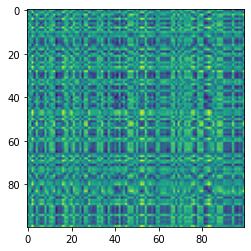

Epoch: 01, Loss: 0.4735, Test Acc: 0.3408
Epoch: 02, Loss: 0.4399, Test Acc: 0.3505
Epoch: 03, Loss: 0.4191, Test Acc: 0.3601
Epoch: 04, Loss: 0.4006, Test Acc: 0.3746
Epoch: 05, Loss: 0.3874, Test Acc: 0.3700
Epoch: 06, Loss: 0.3782, Test Acc: 0.3893
Epoch: 07, Loss: 0.3705, Test Acc: 0.3759
Epoch: 08, Loss: 0.3633, Test Acc: 0.3874
Epoch: 09, Loss: 0.3585, Test Acc: 0.3882
Epoch: 10, Loss: 0.3536, Test Acc: 0.4004


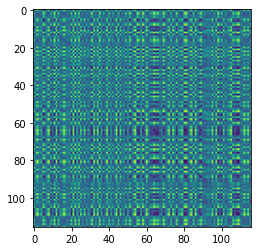

Epoch: 11, Loss: 0.3498, Test Acc: 0.4079
Epoch: 12, Loss: 0.3445, Test Acc: 0.4165
Epoch: 13, Loss: 0.3406, Test Acc: 0.4290
Epoch: 14, Loss: 0.3383, Test Acc: 0.4451
Epoch: 15, Loss: 0.3337, Test Acc: 0.4543
Epoch: 16, Loss: 0.3317, Test Acc: 0.4619
Epoch: 17, Loss: 0.3279, Test Acc: 0.4702
Epoch: 18, Loss: 0.3257, Test Acc: 0.4818
Epoch: 19, Loss: 0.3229, Test Acc: 0.4913
Epoch: 20, Loss: 0.3201, Test Acc: 0.4969


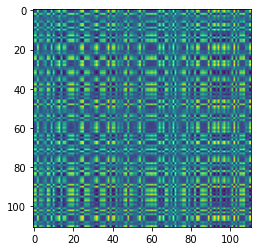

Epoch: 21, Loss: 0.3174, Test Acc: 0.5094
Epoch: 22, Loss: 0.3142, Test Acc: 0.5166
Epoch: 23, Loss: 0.3106, Test Acc: 0.5288
Epoch: 24, Loss: 0.3068, Test Acc: 0.5396
Epoch: 25, Loss: 0.3041, Test Acc: 0.5482
Epoch: 26, Loss: 0.3013, Test Acc: 0.5567
Epoch: 27, Loss: 0.2968, Test Acc: 0.5618
Epoch: 28, Loss: 0.2940, Test Acc: 0.5711
Epoch: 29, Loss: 0.2913, Test Acc: 0.5814
Epoch: 30, Loss: 0.2881, Test Acc: 0.5810


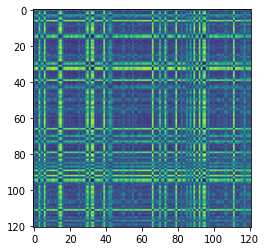

Epoch: 31, Loss: 0.2846, Test Acc: 0.5949
Epoch: 32, Loss: 0.2816, Test Acc: 0.6078
Epoch: 33, Loss: 0.2784, Test Acc: 0.6124
Epoch: 34, Loss: 0.2751, Test Acc: 0.6111
Epoch: 35, Loss: 0.2722, Test Acc: 0.6244
Epoch: 36, Loss: 0.2696, Test Acc: 0.6290
Epoch: 37, Loss: 0.2675, Test Acc: 0.6431
Epoch: 38, Loss: 0.2659, Test Acc: 0.6437
Epoch: 39, Loss: 0.2618, Test Acc: 0.6484
Epoch: 40, Loss: 0.2594, Test Acc: 0.6567


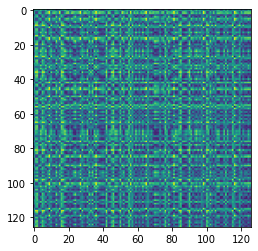

Epoch: 41, Loss: 0.2572, Test Acc: 0.6650
Epoch: 42, Loss: 0.2542, Test Acc: 0.6703
Epoch: 43, Loss: 0.2539, Test Acc: 0.6850
Epoch: 44, Loss: 0.2506, Test Acc: 0.6912
Epoch: 45, Loss: 0.2492, Test Acc: 0.6997
Epoch: 46, Loss: 0.2471, Test Acc: 0.6953
Epoch: 47, Loss: 0.2456, Test Acc: 0.7054
Epoch: 48, Loss: 0.2446, Test Acc: 0.7066
Epoch: 49, Loss: 0.2429, Test Acc: 0.7116
Epoch: 50, Loss: 0.2404, Test Acc: 0.7139


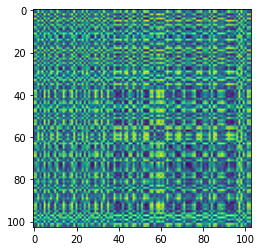

Epoch: 51, Loss: 0.2402, Test Acc: 0.7206
Epoch: 52, Loss: 0.2390, Test Acc: 0.7251
Epoch: 53, Loss: 0.2376, Test Acc: 0.7323
Epoch: 54, Loss: 0.2361, Test Acc: 0.7340
Epoch: 55, Loss: 0.2357, Test Acc: 0.7400
Epoch: 56, Loss: 0.2342, Test Acc: 0.7418
Epoch: 57, Loss: 0.2332, Test Acc: 0.7483
Epoch: 58, Loss: 0.2317, Test Acc: 0.7414
Epoch: 59, Loss: 0.2316, Test Acc: 0.7532
Epoch: 60, Loss: 0.2307, Test Acc: 0.7582


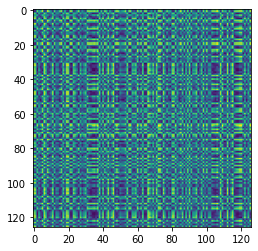

Epoch: 61, Loss: 0.2291, Test Acc: 0.7595
Epoch: 62, Loss: 0.2288, Test Acc: 0.7564
Epoch: 63, Loss: 0.2272, Test Acc: 0.7645
Epoch: 64, Loss: 0.2267, Test Acc: 0.7595
Epoch: 65, Loss: 0.2274, Test Acc: 0.7754
Epoch: 66, Loss: 0.2261, Test Acc: 0.7704
Epoch: 67, Loss: 0.2257, Test Acc: 0.7696
Epoch: 68, Loss: 0.2257, Test Acc: 0.7794
Epoch: 69, Loss: 0.2250, Test Acc: 0.7830
Epoch: 70, Loss: 0.2238, Test Acc: 0.7803


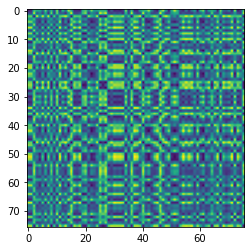

Epoch: 71, Loss: 0.2236, Test Acc: 0.7838
Epoch: 72, Loss: 0.2226, Test Acc: 0.7823
Epoch: 73, Loss: 0.2224, Test Acc: 0.7891
Epoch: 74, Loss: 0.2213, Test Acc: 0.7930
Epoch: 75, Loss: 0.2211, Test Acc: 0.7942
Epoch: 76, Loss: 0.2220, Test Acc: 0.7953
Epoch: 77, Loss: 0.2205, Test Acc: 0.8003
Epoch: 78, Loss: 0.2202, Test Acc: 0.8028
Epoch: 79, Loss: 0.2201, Test Acc: 0.7988
Epoch: 80, Loss: 0.2202, Test Acc: 0.8123


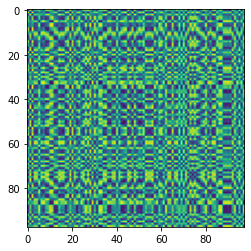

Epoch: 81, Loss: 0.2189, Test Acc: 0.8069
Epoch: 82, Loss: 0.2191, Test Acc: 0.8065
Epoch: 83, Loss: 0.2183, Test Acc: 0.8067
Epoch: 84, Loss: 0.2176, Test Acc: 0.8109
Epoch: 85, Loss: 0.2180, Test Acc: 0.8153
Epoch: 86, Loss: 0.2174, Test Acc: 0.8192
Epoch: 87, Loss: 0.2168, Test Acc: 0.8177
Epoch: 88, Loss: 0.2169, Test Acc: 0.8217
Epoch: 89, Loss: 0.2162, Test Acc: 0.8215
Epoch: 90, Loss: 0.2160, Test Acc: 0.8191


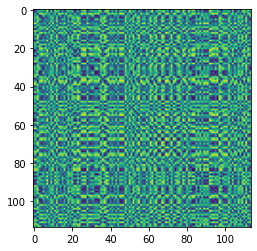

Epoch: 91, Loss: 0.2156, Test Acc: 0.8166
Epoch: 92, Loss: 0.2159, Test Acc: 0.8195
Epoch: 93, Loss: 0.2137, Test Acc: 0.8280
Epoch: 94, Loss: 0.2143, Test Acc: 0.8246
Epoch: 95, Loss: 0.2150, Test Acc: 0.8304
Epoch: 96, Loss: 0.2137, Test Acc: 0.8221
Epoch: 97, Loss: 0.2133, Test Acc: 0.8274
Epoch: 98, Loss: 0.2136, Test Acc: 0.8233
Epoch: 99, Loss: 0.2135, Test Acc: 0.8240
Epoch: 100, Loss: 0.2124, Test Acc: 0.8290


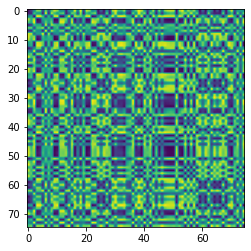

Epoch: 101, Loss: 0.2123, Test Acc: 0.8276
Epoch: 102, Loss: 0.2118, Test Acc: 0.8325
Epoch: 103, Loss: 0.2120, Test Acc: 0.8295
Epoch: 104, Loss: 0.2120, Test Acc: 0.8283
Epoch: 105, Loss: 0.2109, Test Acc: 0.8342
Epoch: 106, Loss: 0.2117, Test Acc: 0.8284
Epoch: 107, Loss: 0.2110, Test Acc: 0.8375
Epoch: 108, Loss: 0.2105, Test Acc: 0.8368
Epoch: 109, Loss: 0.2105, Test Acc: 0.8348
Epoch: 110, Loss: 0.2107, Test Acc: 0.8322


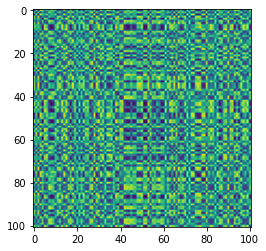

Epoch: 111, Loss: 0.2105, Test Acc: 0.8347
Epoch: 112, Loss: 0.2098, Test Acc: 0.8331
Epoch: 113, Loss: 0.2087, Test Acc: 0.8359
Epoch: 114, Loss: 0.2090, Test Acc: 0.8345
Epoch: 115, Loss: 0.2080, Test Acc: 0.8384
Epoch: 116, Loss: 0.2080, Test Acc: 0.8330
Epoch: 117, Loss: 0.2081, Test Acc: 0.8323
Epoch: 118, Loss: 0.2076, Test Acc: 0.8372
Epoch: 119, Loss: 0.2073, Test Acc: 0.8334
Epoch: 120, Loss: 0.2081, Test Acc: 0.8379


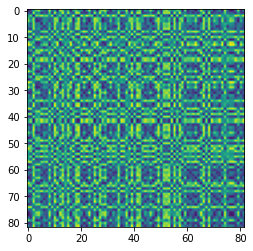

Epoch: 121, Loss: 0.2077, Test Acc: 0.8387
Epoch: 122, Loss: 0.2074, Test Acc: 0.8398
Epoch: 123, Loss: 0.2070, Test Acc: 0.8387
Epoch: 124, Loss: 0.2065, Test Acc: 0.8369
Epoch: 125, Loss: 0.2060, Test Acc: 0.8386
Epoch: 126, Loss: 0.2052, Test Acc: 0.8432
Epoch: 127, Loss: 0.2060, Test Acc: 0.8389
Epoch: 128, Loss: 0.2050, Test Acc: 0.8387
Epoch: 129, Loss: 0.2055, Test Acc: 0.8399
Epoch: 130, Loss: 0.2056, Test Acc: 0.8397


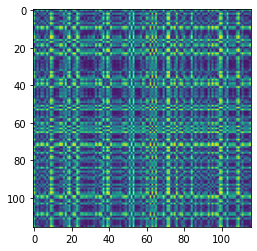

Epoch: 131, Loss: 0.2050, Test Acc: 0.8419
Epoch: 132, Loss: 0.2056, Test Acc: 0.8411
Epoch: 133, Loss: 0.2049, Test Acc: 0.8363
Epoch: 134, Loss: 0.2040, Test Acc: 0.8445
Epoch: 135, Loss: 0.2032, Test Acc: 0.8413
Epoch: 136, Loss: 0.2044, Test Acc: 0.8457
Epoch: 137, Loss: 0.2037, Test Acc: 0.8430
Epoch: 138, Loss: 0.2034, Test Acc: 0.8415
Epoch: 139, Loss: 0.2025, Test Acc: 0.8451
Epoch: 140, Loss: 0.2035, Test Acc: 0.8499


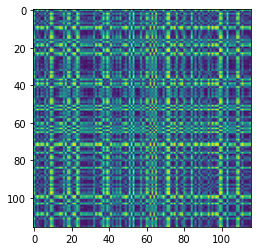

Epoch: 141, Loss: 0.2034, Test Acc: 0.8425
Epoch: 142, Loss: 0.2033, Test Acc: 0.8470
Epoch: 143, Loss: 0.2023, Test Acc: 0.8431
Epoch: 144, Loss: 0.2018, Test Acc: 0.8538
Epoch: 145, Loss: 0.2023, Test Acc: 0.8472
Epoch: 146, Loss: 0.2015, Test Acc: 0.8524
Epoch: 147, Loss: 0.2019, Test Acc: 0.8550
Epoch: 148, Loss: 0.2015, Test Acc: 0.8510
Epoch: 149, Loss: 0.2011, Test Acc: 0.8465
Epoch: 150, Loss: 0.2005, Test Acc: 0.8513


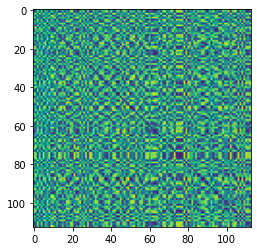

Epoch: 151, Loss: 0.1996, Test Acc: 0.8534
Epoch: 152, Loss: 0.2003, Test Acc: 0.8527
Epoch: 153, Loss: 0.2004, Test Acc: 0.8508
Epoch: 154, Loss: 0.2008, Test Acc: 0.8569
Epoch: 155, Loss: 0.2005, Test Acc: 0.8559
Epoch: 156, Loss: 0.1996, Test Acc: 0.8503
Epoch: 157, Loss: 0.1999, Test Acc: 0.8515
Epoch: 158, Loss: 0.1992, Test Acc: 0.8462
Epoch: 159, Loss: 0.1992, Test Acc: 0.8536
Epoch: 160, Loss: 0.1987, Test Acc: 0.8518


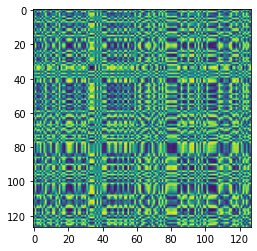

Epoch: 161, Loss: 0.1988, Test Acc: 0.8577
Epoch: 162, Loss: 0.1987, Test Acc: 0.8569
Epoch: 163, Loss: 0.1990, Test Acc: 0.8612
Epoch: 164, Loss: 0.1986, Test Acc: 0.8512
Epoch: 165, Loss: 0.1984, Test Acc: 0.8546
Epoch: 166, Loss: 0.1982, Test Acc: 0.8505
Epoch: 167, Loss: 0.1977, Test Acc: 0.8521
Epoch: 168, Loss: 0.1974, Test Acc: 0.8548
Epoch: 169, Loss: 0.1970, Test Acc: 0.8542
Epoch: 170, Loss: 0.1966, Test Acc: 0.8547


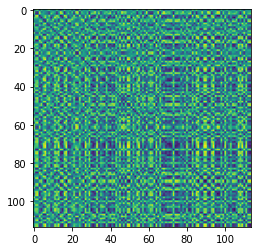

Epoch: 171, Loss: 0.1968, Test Acc: 0.8570
Epoch: 172, Loss: 0.1970, Test Acc: 0.8584
Epoch: 173, Loss: 0.1959, Test Acc: 0.8496
Epoch: 174, Loss: 0.1961, Test Acc: 0.8608
Epoch: 175, Loss: 0.1963, Test Acc: 0.8570
Epoch: 176, Loss: 0.1952, Test Acc: 0.8570
Epoch: 177, Loss: 0.1950, Test Acc: 0.8571
Epoch: 178, Loss: 0.1952, Test Acc: 0.8623
Epoch: 179, Loss: 0.1948, Test Acc: 0.8607
Epoch: 180, Loss: 0.1947, Test Acc: 0.8599


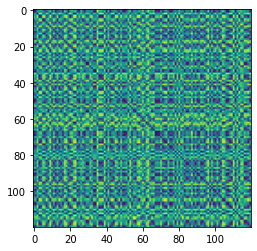

Epoch: 181, Loss: 0.1946, Test Acc: 0.8601
Epoch: 182, Loss: 0.1946, Test Acc: 0.8634
Epoch: 183, Loss: 0.1940, Test Acc: 0.8537
Epoch: 184, Loss: 0.1941, Test Acc: 0.8580
Epoch: 185, Loss: 0.1938, Test Acc: 0.8648
Epoch: 186, Loss: 0.1928, Test Acc: 0.8609
Epoch: 187, Loss: 0.1934, Test Acc: 0.8631
Epoch: 188, Loss: 0.1933, Test Acc: 0.8545
Epoch: 189, Loss: 0.1927, Test Acc: 0.8577
Epoch: 190, Loss: 0.1923, Test Acc: 0.8633


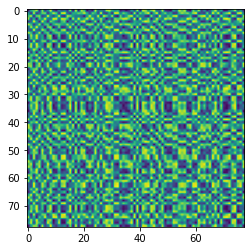

Epoch: 191, Loss: 0.1923, Test Acc: 0.8588
Epoch: 192, Loss: 0.1922, Test Acc: 0.8654
Epoch: 193, Loss: 0.1924, Test Acc: 0.8654
Epoch: 194, Loss: 0.1921, Test Acc: 0.8580
Epoch: 195, Loss: 0.1913, Test Acc: 0.8630
Epoch: 196, Loss: 0.1908, Test Acc: 0.8585
Epoch: 197, Loss: 0.1909, Test Acc: 0.8669
Epoch: 198, Loss: 0.1901, Test Acc: 0.8706
Epoch: 199, Loss: 0.1907, Test Acc: 0.8610
Epoch: 200, Loss: 0.1896, Test Acc: 0.8628


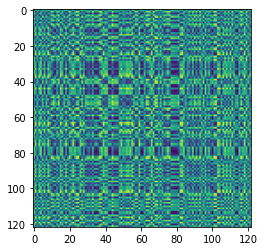

Epoch: 201, Loss: 0.1901, Test Acc: 0.8639
Epoch: 202, Loss: 0.1898, Test Acc: 0.8683
Epoch: 203, Loss: 0.1898, Test Acc: 0.8663
Epoch: 204, Loss: 0.1892, Test Acc: 0.8683
Epoch: 205, Loss: 0.1888, Test Acc: 0.8680
Epoch: 206, Loss: 0.1888, Test Acc: 0.8668
Epoch: 207, Loss: 0.1881, Test Acc: 0.8653
Epoch: 208, Loss: 0.1880, Test Acc: 0.8630
Epoch: 209, Loss: 0.1878, Test Acc: 0.8736
Epoch: 210, Loss: 0.1870, Test Acc: 0.8713


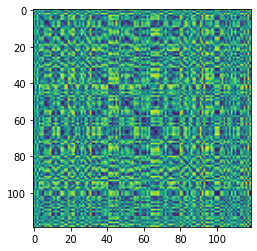

Epoch: 211, Loss: 0.1878, Test Acc: 0.8673
Epoch: 212, Loss: 0.1872, Test Acc: 0.8685
Epoch: 213, Loss: 0.1858, Test Acc: 0.8672
Epoch: 214, Loss: 0.1874, Test Acc: 0.8631
Epoch: 215, Loss: 0.1868, Test Acc: 0.8670
Epoch: 216, Loss: 0.1861, Test Acc: 0.8726
Epoch: 217, Loss: 0.1863, Test Acc: 0.8621
Epoch: 218, Loss: 0.1864, Test Acc: 0.8689
Epoch: 219, Loss: 0.1857, Test Acc: 0.8662
Epoch: 220, Loss: 0.1848, Test Acc: 0.8682


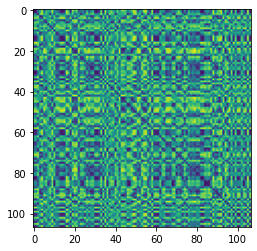

Epoch: 221, Loss: 0.1847, Test Acc: 0.8648
Epoch: 222, Loss: 0.1852, Test Acc: 0.8708
Epoch: 223, Loss: 0.1846, Test Acc: 0.8635
Epoch: 224, Loss: 0.1845, Test Acc: 0.8675
Epoch: 225, Loss: 0.1838, Test Acc: 0.8738
Epoch: 226, Loss: 0.1834, Test Acc: 0.8696
Epoch: 227, Loss: 0.1840, Test Acc: 0.8673
Epoch: 228, Loss: 0.1833, Test Acc: 0.8692
Epoch: 229, Loss: 0.1832, Test Acc: 0.8723
Epoch: 230, Loss: 0.1837, Test Acc: 0.8731


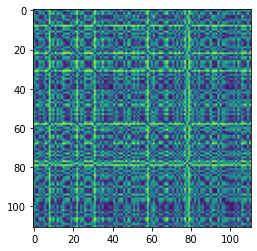

Epoch: 231, Loss: 0.1826, Test Acc: 0.8760
Epoch: 232, Loss: 0.1823, Test Acc: 0.8677
Epoch: 233, Loss: 0.1821, Test Acc: 0.8780
Epoch: 234, Loss: 0.1824, Test Acc: 0.8769
Epoch: 235, Loss: 0.1818, Test Acc: 0.8754
Epoch: 236, Loss: 0.1813, Test Acc: 0.8716
Epoch: 237, Loss: 0.1805, Test Acc: 0.8640
Epoch: 238, Loss: 0.1814, Test Acc: 0.8693
Epoch: 239, Loss: 0.1808, Test Acc: 0.8677
Epoch: 240, Loss: 0.1807, Test Acc: 0.8789


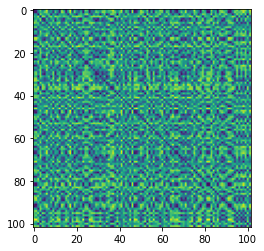

Epoch: 241, Loss: 0.1812, Test Acc: 0.8706
Epoch: 242, Loss: 0.1798, Test Acc: 0.8689
Epoch: 243, Loss: 0.1796, Test Acc: 0.8716
Epoch: 244, Loss: 0.1794, Test Acc: 0.8682
Epoch: 245, Loss: 0.1796, Test Acc: 0.8733
Epoch: 246, Loss: 0.1798, Test Acc: 0.8732
Epoch: 247, Loss: 0.1791, Test Acc: 0.8747
Epoch: 248, Loss: 0.1791, Test Acc: 0.8771
Epoch: 249, Loss: 0.1790, Test Acc: 0.8768
Epoch: 250, Loss: 0.1784, Test Acc: 0.8740


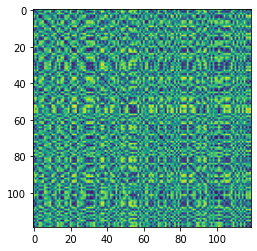

Epoch: 251, Loss: 0.1781, Test Acc: 0.8784
Epoch: 252, Loss: 0.1785, Test Acc: 0.8778
Epoch: 253, Loss: 0.1781, Test Acc: 0.8814
Epoch: 254, Loss: 0.1778, Test Acc: 0.8762
Epoch: 255, Loss: 0.1769, Test Acc: 0.8746
Epoch: 256, Loss: 0.1772, Test Acc: 0.8802
Epoch: 257, Loss: 0.1770, Test Acc: 0.8742
Epoch: 258, Loss: 0.1768, Test Acc: 0.8728
Epoch: 259, Loss: 0.1767, Test Acc: 0.8774
Epoch: 260, Loss: 0.1767, Test Acc: 0.8720


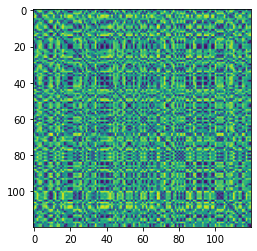

Epoch: 261, Loss: 0.1761, Test Acc: 0.8698
Epoch: 262, Loss: 0.1774, Test Acc: 0.8716
Epoch: 263, Loss: 0.1763, Test Acc: 0.8763
Epoch: 264, Loss: 0.1763, Test Acc: 0.8735
Epoch: 265, Loss: 0.1754, Test Acc: 0.8779
Epoch: 266, Loss: 0.1758, Test Acc: 0.8821
Epoch: 267, Loss: 0.1752, Test Acc: 0.8823
Epoch: 268, Loss: 0.1758, Test Acc: 0.8857
Epoch: 269, Loss: 0.1758, Test Acc: 0.8789
Epoch: 270, Loss: 0.1751, Test Acc: 0.8795


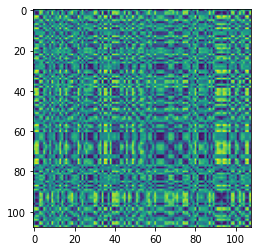

Epoch: 271, Loss: 0.1752, Test Acc: 0.8841
Epoch: 272, Loss: 0.1744, Test Acc: 0.8806
Epoch: 273, Loss: 0.1736, Test Acc: 0.8787
Epoch: 274, Loss: 0.1744, Test Acc: 0.8772
Epoch: 275, Loss: 0.1739, Test Acc: 0.8727
Epoch: 276, Loss: 0.1748, Test Acc: 0.8773
Epoch: 277, Loss: 0.1741, Test Acc: 0.8859
Epoch: 278, Loss: 0.1737, Test Acc: 0.8863
Epoch: 279, Loss: 0.1731, Test Acc: 0.8807
Epoch: 280, Loss: 0.1729, Test Acc: 0.8796


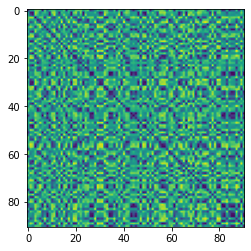

Epoch: 281, Loss: 0.1732, Test Acc: 0.8800
Epoch: 282, Loss: 0.1733, Test Acc: 0.8795
Epoch: 283, Loss: 0.1725, Test Acc: 0.8803
Epoch: 284, Loss: 0.1725, Test Acc: 0.8828
Epoch: 285, Loss: 0.1721, Test Acc: 0.8863
Epoch: 286, Loss: 0.1724, Test Acc: 0.8717
Epoch: 287, Loss: 0.1721, Test Acc: 0.8740
Epoch: 288, Loss: 0.1707, Test Acc: 0.8786
Epoch: 289, Loss: 0.1720, Test Acc: 0.8784
Epoch: 290, Loss: 0.1714, Test Acc: 0.8820


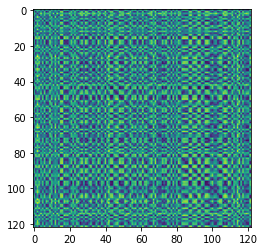

Epoch: 291, Loss: 0.1714, Test Acc: 0.8809
Epoch: 292, Loss: 0.1716, Test Acc: 0.8812
Epoch: 293, Loss: 0.1713, Test Acc: 0.8812
Epoch: 294, Loss: 0.1717, Test Acc: 0.8789
Epoch: 295, Loss: 0.1710, Test Acc: 0.8835
Epoch: 296, Loss: 0.1709, Test Acc: 0.8814
Epoch: 297, Loss: 0.1700, Test Acc: 0.8800
Epoch: 298, Loss: 0.1709, Test Acc: 0.8814
Epoch: 299, Loss: 0.1709, Test Acc: 0.8749


In [13]:
n_epoch =300
margin = 1
optimizer = optim.Adam(GATModel.parameters(), lr=5e-6)

def train(model, optimizer, loader):
    model.train()
    
    total_loss = 0
    for data in loader:
        optimizer.zero_grad()  # Clear gradients.
        
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)

        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #print(loss.item())
                
        loss.backward()  # Backward pass.
        optimizer.step()  # Update model parameters.
        total_loss += loss.item() * data.num_graphs

    return total_loss / len(loader), pmatrix

@torch.no_grad()
def test(model, loader):
    model.eval()
    
    total_correct = 0
    for data in loader:
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)
        
        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #total_loss += loss.item() * data.num_graphs
        row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
        num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
        test_acc = num_match / data.pos.shape[0]
        total_correct += test_acc

    return total_correct / len(loader)


for epoch in range(0, n_epoch):
    loss, pmatrix = train(GATModel, optimizer, train_loader)
    test_acc = test(GATModel, test_loader)
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Test Acc: {test_acc:.4f}')

    if epoch %10 == 0:
        plt.imshow(pmatrix.detach().cpu().numpy())
        plt.show()


In [15]:
for test_data in test_dataset:
    origin_output = GATModel(test_data.pos, test_data.edge_index)
    transform_output = GATModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
    num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
    test_acc = num_match / test_data.pos.shape[0]
    print(test_acc)

tensor(0.8750)
tensor(0.8627)
tensor(0.9505)
tensor(1.)
tensor(0.7258)
tensor(0.9505)
tensor(0.9664)
tensor(0.8899)
tensor(0.9352)
tensor(0.9680)
tensor(0.7190)
tensor(0.9658)
tensor(0.9457)
tensor(0.8130)
tensor(0.8026)
tensor(0.8866)
tensor(0.9677)
tensor(0.8087)
tensor(0.8091)
tensor(0.8571)
tensor(0.8839)
tensor(0.8632)
tensor(0.7456)
tensor(0.9675)
tensor(0.8779)
tensor(0.8118)
tensor(0.8722)
tensor(0.6418)
tensor(0.8182)
tensor(0.9558)
tensor(0.9123)
tensor(0.9806)
tensor(0.7402)
tensor(0.9009)
tensor(0.9551)
tensor(0.7273)
tensor(0.9250)
tensor(0.6642)
tensor(0.8741)
tensor(0.9219)
tensor(0.9159)
tensor(0.9304)
tensor(0.9009)
tensor(0.8485)
tensor(0.9821)
tensor(0.8934)
tensor(0.9098)


In [17]:
total_acc = 0
for test_data in test_dataset:
    origin_output = GATModel(test_data.pos, test_data.edge_index)
    transform_output = GATModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    match = torch.argmin(pmatrix, 0)
    num_match = 0
    for i in range(len(match)):
        if match[i] == i:
            num_match += 1
    test_acc = num_match / test_data.pos.shape[0]
    total_acc += test_acc
    print(test_acc)
mean_acc = total_acc/len(test_dataset)
print("mean_acc", mean_acc)

0.6691176470588235
0.3627450980392157
0.46534653465346537
0.6752136752136753
0.4274193548387097
0.504950495049505
0.7478991596638656
0.5963302752293578
0.3611111111111111
0.6
0.5289256198347108
0.8547008547008547
0.44565217391304346
0.4715447154471545
0.40789473684210525
0.6288659793814433
0.7661290322580645
0.5130434782608696
0.5181818181818182
0.5054945054945055
0.7410714285714286
0.4358974358974359
0.3333333333333333
0.3333333333333333
0.6106870229007634
0.5764705882352941
0.6766917293233082
0.34328358208955223
0.4155844155844156
0.6194690265486725
0.5877192982456141
0.7087378640776699
0.18110236220472442
0.5045045045045045
0.5842696629213483
0.41818181818181815
0.325
0.1865671641791045
0.4825174825174825
0.6015625
0.3925233644859813
0.5478260869565217
0.5135135135135135
0.6212121212121212
0.7053571428571429
0.5655737704918032
0.6885245901639344
mean_acc 0.5266187533511301


In [18]:
#save the model
PATH = "/home/melina/桌面/jupyter/intellisys/week5/models/GATmodel_1.p"
torch.save(GATModel.state_dict(),PATH)

### 2.2 GNN with EdgeConv

In [18]:
from torch_geometric.nn import EdgeConv
from torch.nn import Sequential, Linear, ReLU


class EdgeGCN(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(EdgeGCN, self).__init__()
        torch.manual_seed(1234567)
        self.sequential = Sequential(
            Linear(in_channels, out_channels),
            ReLU(),
            Linear(out_channels, out_channels),
            ReLU(),
            Linear(out_channels, out_channels)
        )
        self.conv1 = EdgeConv(self.sequential)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        return x

EdgeModel = EdgeGCN(in_channels= 3*2, out_channels=512)
print(EdgeModel)

EdgeGCN(
  (sequential): Sequential(
    (0): Linear(in_features=6, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
  )
  (conv1): EdgeConv(nn=Sequential(
    (0): Linear(in_features=6, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
  ))
)


Epoch: 00, Loss: 0.1326, Test Acc: 0.6573


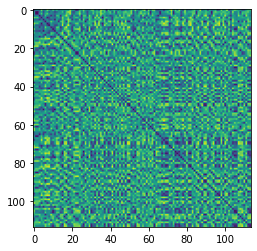

Epoch: 01, Loss: 0.1323, Test Acc: 0.6607
Epoch: 02, Loss: 0.1326, Test Acc: 0.6629
Epoch: 03, Loss: 0.1324, Test Acc: 0.6569
Epoch: 04, Loss: 0.1315, Test Acc: 0.6623
Epoch: 05, Loss: 0.1319, Test Acc: 0.6488
Epoch: 06, Loss: 0.1317, Test Acc: 0.6592
Epoch: 07, Loss: 0.1315, Test Acc: 0.6692
Epoch: 08, Loss: 0.1314, Test Acc: 0.6485
Epoch: 09, Loss: 0.1309, Test Acc: 0.6635
Epoch: 10, Loss: 0.1309, Test Acc: 0.6683


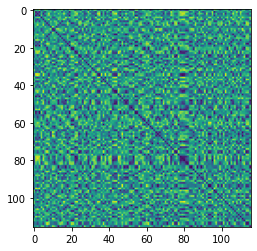

Epoch: 11, Loss: 0.1310, Test Acc: 0.6659
Epoch: 12, Loss: 0.1305, Test Acc: 0.6691
Epoch: 13, Loss: 0.1302, Test Acc: 0.6603
Epoch: 14, Loss: 0.1302, Test Acc: 0.6647
Epoch: 15, Loss: 0.1299, Test Acc: 0.6701
Epoch: 16, Loss: 0.1296, Test Acc: 0.6658
Epoch: 17, Loss: 0.1295, Test Acc: 0.6724
Epoch: 18, Loss: 0.1292, Test Acc: 0.6613
Epoch: 19, Loss: 0.1297, Test Acc: 0.6730
Epoch: 20, Loss: 0.1292, Test Acc: 0.6735


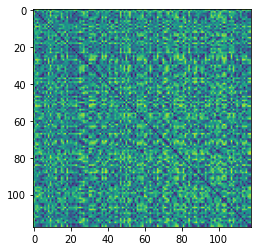

Epoch: 21, Loss: 0.1289, Test Acc: 0.6712
Epoch: 22, Loss: 0.1298, Test Acc: 0.6732
Epoch: 23, Loss: 0.1286, Test Acc: 0.6823
Epoch: 24, Loss: 0.1290, Test Acc: 0.6747
Epoch: 25, Loss: 0.1284, Test Acc: 0.6806
Epoch: 26, Loss: 0.1290, Test Acc: 0.6851
Epoch: 27, Loss: 0.1279, Test Acc: 0.6659
Epoch: 28, Loss: 0.1284, Test Acc: 0.6753
Epoch: 29, Loss: 0.1283, Test Acc: 0.6792
Epoch: 30, Loss: 0.1275, Test Acc: 0.6849


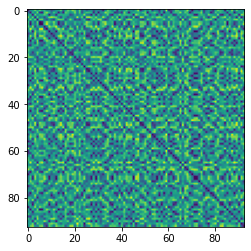

Epoch: 31, Loss: 0.1275, Test Acc: 0.6783
Epoch: 32, Loss: 0.1273, Test Acc: 0.6781
Epoch: 33, Loss: 0.1272, Test Acc: 0.6888
Epoch: 34, Loss: 0.1271, Test Acc: 0.6889
Epoch: 35, Loss: 0.1275, Test Acc: 0.6724
Epoch: 36, Loss: 0.1265, Test Acc: 0.6883
Epoch: 37, Loss: 0.1266, Test Acc: 0.6821
Epoch: 38, Loss: 0.1262, Test Acc: 0.6845
Epoch: 39, Loss: 0.1264, Test Acc: 0.6953
Epoch: 40, Loss: 0.1264, Test Acc: 0.6892


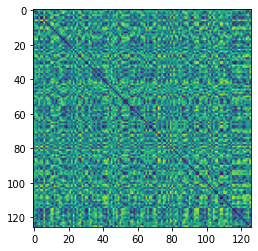

Epoch: 41, Loss: 0.1264, Test Acc: 0.6933
Epoch: 42, Loss: 0.1259, Test Acc: 0.7036
Epoch: 43, Loss: 0.1258, Test Acc: 0.6918
Epoch: 44, Loss: 0.1256, Test Acc: 0.6959
Epoch: 45, Loss: 0.1261, Test Acc: 0.6987
Epoch: 46, Loss: 0.1250, Test Acc: 0.6896
Epoch: 47, Loss: 0.1252, Test Acc: 0.7004
Epoch: 48, Loss: 0.1250, Test Acc: 0.6899
Epoch: 49, Loss: 0.1250, Test Acc: 0.7000
Epoch: 50, Loss: 0.1247, Test Acc: 0.6999


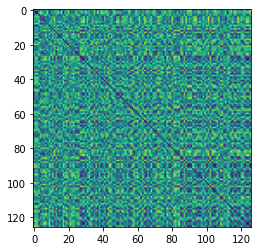

Epoch: 51, Loss: 0.1246, Test Acc: 0.7043
Epoch: 52, Loss: 0.1247, Test Acc: 0.6968
Epoch: 53, Loss: 0.1245, Test Acc: 0.7036
Epoch: 54, Loss: 0.1248, Test Acc: 0.7066
Epoch: 55, Loss: 0.1241, Test Acc: 0.7053
Epoch: 56, Loss: 0.1242, Test Acc: 0.7019
Epoch: 57, Loss: 0.1236, Test Acc: 0.7051
Epoch: 58, Loss: 0.1240, Test Acc: 0.7098
Epoch: 59, Loss: 0.1239, Test Acc: 0.7062
Epoch: 60, Loss: 0.1238, Test Acc: 0.7111


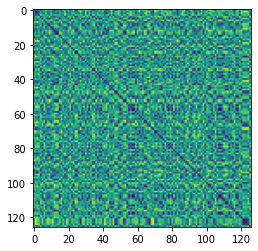

Epoch: 61, Loss: 0.1233, Test Acc: 0.6932
Epoch: 62, Loss: 0.1232, Test Acc: 0.7009
Epoch: 63, Loss: 0.1230, Test Acc: 0.7078
Epoch: 64, Loss: 0.1229, Test Acc: 0.7151
Epoch: 65, Loss: 0.1235, Test Acc: 0.7130
Epoch: 66, Loss: 0.1225, Test Acc: 0.7073
Epoch: 67, Loss: 0.1233, Test Acc: 0.7163
Epoch: 68, Loss: 0.1223, Test Acc: 0.7110
Epoch: 69, Loss: 0.1228, Test Acc: 0.7188
Epoch: 70, Loss: 0.1226, Test Acc: 0.7137


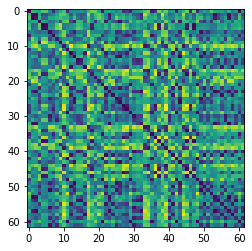

Epoch: 71, Loss: 0.1222, Test Acc: 0.7109
Epoch: 72, Loss: 0.1224, Test Acc: 0.7106
Epoch: 73, Loss: 0.1221, Test Acc: 0.7165
Epoch: 74, Loss: 0.1225, Test Acc: 0.7156
Epoch: 75, Loss: 0.1218, Test Acc: 0.7197
Epoch: 76, Loss: 0.1219, Test Acc: 0.7180
Epoch: 77, Loss: 0.1215, Test Acc: 0.7172
Epoch: 78, Loss: 0.1215, Test Acc: 0.7209
Epoch: 79, Loss: 0.1215, Test Acc: 0.7178
Epoch: 80, Loss: 0.1221, Test Acc: 0.7177


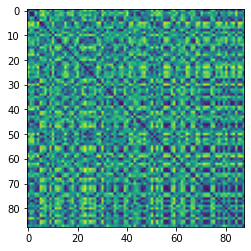

Epoch: 81, Loss: 0.1212, Test Acc: 0.7190
Epoch: 82, Loss: 0.1208, Test Acc: 0.7200
Epoch: 83, Loss: 0.1212, Test Acc: 0.7164
Epoch: 84, Loss: 0.1209, Test Acc: 0.7190
Epoch: 85, Loss: 0.1211, Test Acc: 0.7249
Epoch: 86, Loss: 0.1204, Test Acc: 0.7184
Epoch: 87, Loss: 0.1205, Test Acc: 0.7165
Epoch: 88, Loss: 0.1206, Test Acc: 0.7278
Epoch: 89, Loss: 0.1204, Test Acc: 0.7271
Epoch: 90, Loss: 0.1201, Test Acc: 0.7221


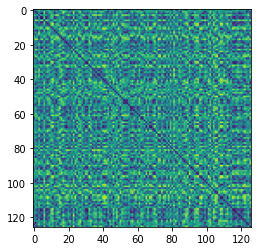

Epoch: 91, Loss: 0.1205, Test Acc: 0.7250
Epoch: 92, Loss: 0.1201, Test Acc: 0.7302
Epoch: 93, Loss: 0.1196, Test Acc: 0.7320
Epoch: 94, Loss: 0.1200, Test Acc: 0.7276
Epoch: 95, Loss: 0.1195, Test Acc: 0.7227
Epoch: 96, Loss: 0.1198, Test Acc: 0.7309
Epoch: 97, Loss: 0.1194, Test Acc: 0.7240
Epoch: 98, Loss: 0.1196, Test Acc: 0.7317
Epoch: 99, Loss: 0.1198, Test Acc: 0.7296
Epoch: 100, Loss: 0.1193, Test Acc: 0.7233


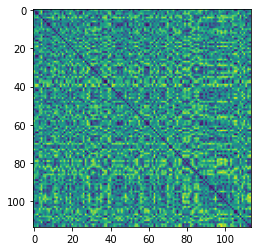

Epoch: 101, Loss: 0.1188, Test Acc: 0.7336
Epoch: 102, Loss: 0.1192, Test Acc: 0.7284
Epoch: 103, Loss: 0.1191, Test Acc: 0.7373
Epoch: 104, Loss: 0.1189, Test Acc: 0.7371
Epoch: 105, Loss: 0.1186, Test Acc: 0.7321
Epoch: 106, Loss: 0.1189, Test Acc: 0.7388
Epoch: 107, Loss: 0.1183, Test Acc: 0.7382
Epoch: 108, Loss: 0.1186, Test Acc: 0.7346
Epoch: 109, Loss: 0.1187, Test Acc: 0.7319
Epoch: 110, Loss: 0.1183, Test Acc: 0.7434


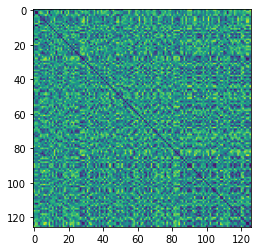

Epoch: 111, Loss: 0.1186, Test Acc: 0.7463
Epoch: 112, Loss: 0.1181, Test Acc: 0.7424
Epoch: 113, Loss: 0.1181, Test Acc: 0.7432
Epoch: 114, Loss: 0.1178, Test Acc: 0.7484
Epoch: 115, Loss: 0.1177, Test Acc: 0.7377
Epoch: 116, Loss: 0.1178, Test Acc: 0.7401
Epoch: 117, Loss: 0.1175, Test Acc: 0.7461
Epoch: 118, Loss: 0.1173, Test Acc: 0.7458
Epoch: 119, Loss: 0.1175, Test Acc: 0.7397
Epoch: 120, Loss: 0.1175, Test Acc: 0.7530


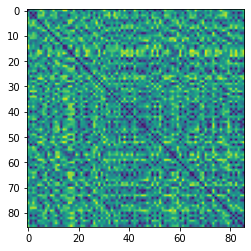

Epoch: 121, Loss: 0.1172, Test Acc: 0.7458
Epoch: 122, Loss: 0.1169, Test Acc: 0.7483
Epoch: 123, Loss: 0.1168, Test Acc: 0.7474
Epoch: 124, Loss: 0.1169, Test Acc: 0.7524
Epoch: 125, Loss: 0.1170, Test Acc: 0.7494
Epoch: 126, Loss: 0.1166, Test Acc: 0.7400
Epoch: 127, Loss: 0.1168, Test Acc: 0.7560
Epoch: 128, Loss: 0.1166, Test Acc: 0.7477
Epoch: 129, Loss: 0.1164, Test Acc: 0.7532
Epoch: 130, Loss: 0.1163, Test Acc: 0.7563


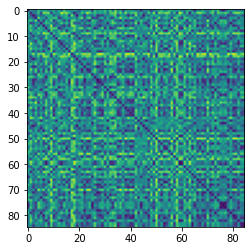

Epoch: 131, Loss: 0.1165, Test Acc: 0.7372
Epoch: 132, Loss: 0.1162, Test Acc: 0.7603
Epoch: 133, Loss: 0.1162, Test Acc: 0.7494
Epoch: 134, Loss: 0.1162, Test Acc: 0.7572
Epoch: 135, Loss: 0.1160, Test Acc: 0.7531
Epoch: 136, Loss: 0.1160, Test Acc: 0.7511
Epoch: 137, Loss: 0.1156, Test Acc: 0.7510
Epoch: 138, Loss: 0.1155, Test Acc: 0.7621
Epoch: 139, Loss: 0.1159, Test Acc: 0.7643
Epoch: 140, Loss: 0.1154, Test Acc: 0.7687


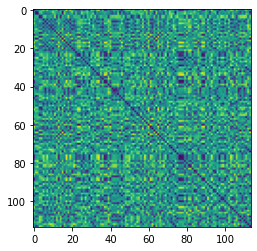

Epoch: 141, Loss: 0.1152, Test Acc: 0.7595
Epoch: 142, Loss: 0.1150, Test Acc: 0.7571
Epoch: 143, Loss: 0.1154, Test Acc: 0.7643
Epoch: 144, Loss: 0.1155, Test Acc: 0.7649
Epoch: 145, Loss: 0.1155, Test Acc: 0.7663
Epoch: 146, Loss: 0.1147, Test Acc: 0.7635
Epoch: 147, Loss: 0.1153, Test Acc: 0.7677
Epoch: 148, Loss: 0.1148, Test Acc: 0.7599
Epoch: 149, Loss: 0.1148, Test Acc: 0.7640
Epoch: 150, Loss: 0.1151, Test Acc: 0.7723


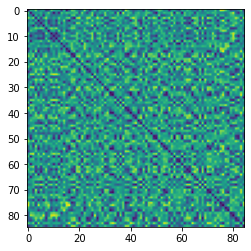

Epoch: 151, Loss: 0.1144, Test Acc: 0.7722
Epoch: 152, Loss: 0.1151, Test Acc: 0.7720
Epoch: 153, Loss: 0.1148, Test Acc: 0.7694
Epoch: 154, Loss: 0.1142, Test Acc: 0.7659
Epoch: 155, Loss: 0.1140, Test Acc: 0.7716
Epoch: 156, Loss: 0.1138, Test Acc: 0.7672
Epoch: 157, Loss: 0.1139, Test Acc: 0.7692
Epoch: 158, Loss: 0.1135, Test Acc: 0.7731
Epoch: 159, Loss: 0.1145, Test Acc: 0.7733
Epoch: 160, Loss: 0.1141, Test Acc: 0.7731


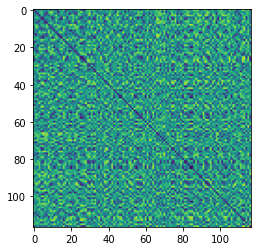

Epoch: 161, Loss: 0.1138, Test Acc: 0.7748
Epoch: 162, Loss: 0.1136, Test Acc: 0.7686
Epoch: 163, Loss: 0.1135, Test Acc: 0.7791
Epoch: 164, Loss: 0.1133, Test Acc: 0.7711
Epoch: 165, Loss: 0.1133, Test Acc: 0.7791
Epoch: 166, Loss: 0.1134, Test Acc: 0.7903
Epoch: 167, Loss: 0.1135, Test Acc: 0.7847
Epoch: 168, Loss: 0.1135, Test Acc: 0.7831
Epoch: 169, Loss: 0.1132, Test Acc: 0.7861
Epoch: 170, Loss: 0.1127, Test Acc: 0.7782


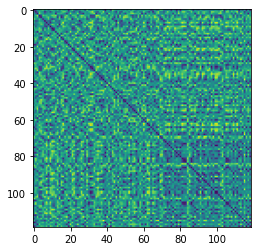

Epoch: 171, Loss: 0.1134, Test Acc: 0.7732
Epoch: 172, Loss: 0.1132, Test Acc: 0.7836
Epoch: 173, Loss: 0.1134, Test Acc: 0.7816
Epoch: 174, Loss: 0.1129, Test Acc: 0.7832
Epoch: 175, Loss: 0.1133, Test Acc: 0.7881
Epoch: 176, Loss: 0.1125, Test Acc: 0.7839
Epoch: 177, Loss: 0.1126, Test Acc: 0.7833
Epoch: 178, Loss: 0.1124, Test Acc: 0.7853
Epoch: 179, Loss: 0.1125, Test Acc: 0.7870
Epoch: 180, Loss: 0.1128, Test Acc: 0.7907


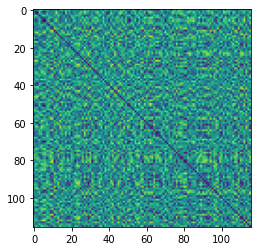

Epoch: 181, Loss: 0.1124, Test Acc: 0.7880
Epoch: 182, Loss: 0.1121, Test Acc: 0.7846
Epoch: 183, Loss: 0.1124, Test Acc: 0.7849
Epoch: 184, Loss: 0.1119, Test Acc: 0.7896
Epoch: 185, Loss: 0.1117, Test Acc: 0.7914
Epoch: 186, Loss: 0.1118, Test Acc: 0.7871
Epoch: 187, Loss: 0.1120, Test Acc: 0.7947
Epoch: 188, Loss: 0.1118, Test Acc: 0.7866
Epoch: 189, Loss: 0.1116, Test Acc: 0.7853
Epoch: 190, Loss: 0.1116, Test Acc: 0.7950


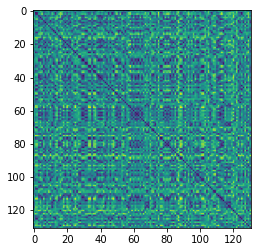

Epoch: 191, Loss: 0.1121, Test Acc: 0.7926
Epoch: 192, Loss: 0.1116, Test Acc: 0.7901
Epoch: 193, Loss: 0.1118, Test Acc: 0.7960
Epoch: 194, Loss: 0.1116, Test Acc: 0.8034
Epoch: 195, Loss: 0.1109, Test Acc: 0.7956
Epoch: 196, Loss: 0.1115, Test Acc: 0.7977
Epoch: 197, Loss: 0.1111, Test Acc: 0.7962
Epoch: 198, Loss: 0.1110, Test Acc: 0.7966
Epoch: 199, Loss: 0.1112, Test Acc: 0.7924


In [21]:
n_epoch =200
margin = 1
optimizer = optim.Adam(EdgeModel.parameters(), lr=5e-6)

def train(model, optimizer, loader):
    model.train()
    
    total_loss = 0
    for data in loader:
        optimizer.zero_grad()  # Clear gradients.
        
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)

        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #print(loss.item())
                
        loss.backward()  # Backward pass.
        optimizer.step()  # Update model parameters.
        total_loss += loss.item() * data.num_graphs

    return total_loss / len(loader), pmatrix

@torch.no_grad()
def test(model, loader):
    model.eval()
    
    total_correct = 0
    for data in loader:
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)
        
        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #total_loss += loss.item() * data.num_graphs
        row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
        num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
        test_acc = num_match / data.pos.shape[0]
        total_correct += test_acc

    return total_correct / len(loader)


for epoch in range(0, n_epoch):
    loss, pmatrix = train(EdgeModel, optimizer, train_loader)
    test_acc = test(EdgeModel, test_loader)
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Test Acc: {test_acc:.4f}')

    if epoch %10 == 0:
        plt.imshow(pmatrix.detach().cpu().numpy())
        plt.show()


In [22]:
print(pmatrix[0])

tensor([0.1294, 1.2830, 1.3248, 1.4836, 1.3902, 0.7425, 0.4674, 0.9431, 1.4106,
        0.6176, 1.3718, 1.0623, 1.4462, 0.8917, 1.3775, 0.7634, 1.1676, 0.5928,
        0.7653, 1.6404, 1.1359, 0.2744, 1.1287, 0.2170, 1.0178, 1.1564, 1.0631,
        0.3158, 0.4915, 0.8257, 0.7780, 1.5959, 1.4358, 0.9439, 0.4958, 1.2475,
        1.1340, 1.0090, 1.0910, 0.6401, 0.5083, 1.1372, 0.7545, 1.0270, 1.0007,
        0.8182, 1.3812, 1.3038, 0.5245, 1.2384, 0.2456, 0.1238, 1.2886, 0.3399,
        0.2512, 1.1888, 1.1332, 0.9271, 1.1117, 1.1771, 1.2014, 1.6504, 0.5382,
        1.5294, 1.0300, 0.9555, 1.2882, 1.3901, 0.5139, 0.3537, 1.4517, 1.1920,
        0.9605, 0.6901, 0.2683, 1.0030, 1.1119, 1.0297, 1.5963, 0.7534, 1.4911,
        1.4649, 1.1887], grad_fn=<SelectBackward>)


In [23]:
for test_data in test_dataset:
    origin_output = EdgeModel(test_data.pos, test_data.edge_index)
    transform_output = EdgeModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
    num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
    test_acc = num_match / test_data.pos.shape[0]
    print(test_acc)

tensor(0.6618)
tensor(0.8725)
tensor(0.8911)
tensor(0.7350)
tensor(0.8790)
tensor(0.8614)
tensor(0.6471)
tensor(0.5596)
tensor(0.9352)
tensor(0.7760)
tensor(0.7934)
tensor(0.8803)
tensor(0.8478)
tensor(0.8049)
tensor(1.)
tensor(0.7423)
tensor(0.8145)
tensor(0.8348)
tensor(0.7364)
tensor(0.7253)
tensor(0.8929)
tensor(0.9060)
tensor(0.8509)
tensor(0.7805)
tensor(0.9313)
tensor(0.7647)
tensor(0.7895)
tensor(0.7015)
tensor(0.9091)
tensor(0.8761)
tensor(0.7018)
tensor(0.7767)
tensor(0.8819)
tensor(0.5045)
tensor(0.9101)
tensor(0.8909)
tensor(0.8083)
tensor(0.6866)
tensor(0.5455)
tensor(0.8438)
tensor(0.8972)
tensor(0.8957)
tensor(0.8108)
tensor(0.4242)
tensor(0.7232)
tensor(0.7869)
tensor(0.7541)


In [24]:
total_acc = 0
for test_data in test_dataset:
    origin_output = EdgeModel(test_data.pos, test_data.edge_index)
    transform_output = EdgeModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    match = torch.argmin(pmatrix, 0)
    num_match = 0
    for i in range(len(match)):
        if match[i] == i:
            num_match += 1
    test_acc = num_match / test_data.pos.shape[0]
    total_acc += test_acc
    print(test_acc)
mean_acc = total_acc/len(test_dataset)
print("mean_acc", mean_acc)

0.49264705882352944
0.6862745098039216
0.7128712871287128
0.6068376068376068
0.6451612903225806
0.6138613861386139
0.4789915966386555
0.5045871559633027
0.75
0.552
0.5619834710743802
0.7094017094017094
0.6847826086956522
0.7073170731707317
0.7236842105263158
0.6185567010309279
0.6532258064516129
0.5652173913043478
0.6272727272727273
0.5934065934065934
0.7142857142857143
0.7094017094017094
0.6666666666666666
0.6260162601626016
0.7022900763358778
0.5882352941176471
0.6165413533834586
0.5746268656716418
0.7272727272727273
0.672566371681416
0.5350877192982456
0.6407766990291263
0.7322834645669292
0.5135135135135135
0.6629213483146067
0.7
0.625
0.5746268656716418
0.3986013986013986
0.65625
0.7476635514018691
0.6869565217391305
0.5855855855855856
0.3939393939393939
0.5714285714285714
0.5983606557377049
0.5081967213114754
mean_acc 0.6216420262363952


In [25]:
#save the model
PATH = "/home/melina/桌面/jupyter/intellisys/week5/models/EdgeModel_2.p"
torch.save(EdgeModel.state_dict(),PATH)

### 2.3 GNN with GraphConv

In [50]:
from torch_geometric.nn import GraphConv


class GraphGCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphGCN, self).__init__()
        torch.manual_seed(1234567)
        self.conv1 = GraphConv(in_channels, hidden_channels)
        self.conv2 = GraphConv(hidden_channels, hidden_channels)
        self.conv3 = GraphConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)        
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv3(x, edge_index) 
        return x

GraphModel = GraphGCN(in_channels= 3, hidden_channels=128, out_channels=512)
print(GraphModel)

GraphGCN(
  (conv1): GraphConv(3, 128)
  (conv2): GraphConv(128, 128)
  (conv3): GraphConv(128, 512)
)


Epoch: 00, Loss: 0.2608, Test Acc: 0.1729


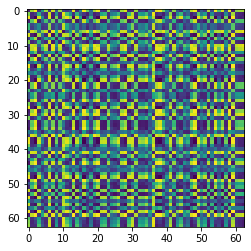

Epoch: 01, Loss: 0.2614, Test Acc: 0.1710
Epoch: 02, Loss: 0.2600, Test Acc: 0.1726
Epoch: 03, Loss: 0.2597, Test Acc: 0.1719
Epoch: 04, Loss: 0.2595, Test Acc: 0.1731
Epoch: 05, Loss: 0.2593, Test Acc: 0.1711
Epoch: 06, Loss: 0.2598, Test Acc: 0.1747
Epoch: 07, Loss: 0.2613, Test Acc: 0.1751
Epoch: 08, Loss: 0.2591, Test Acc: 0.1723
Epoch: 09, Loss: 0.2597, Test Acc: 0.1668
Epoch: 10, Loss: 0.2568, Test Acc: 0.1660


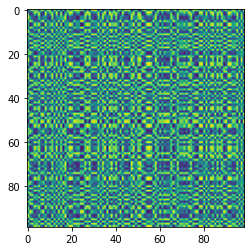

Epoch: 11, Loss: 0.2593, Test Acc: 0.1725
Epoch: 12, Loss: 0.2576, Test Acc: 0.1753
Epoch: 13, Loss: 0.2592, Test Acc: 0.1763
Epoch: 14, Loss: 0.2579, Test Acc: 0.1714
Epoch: 15, Loss: 0.2587, Test Acc: 0.1759
Epoch: 16, Loss: 0.2587, Test Acc: 0.1740
Epoch: 17, Loss: 0.2590, Test Acc: 0.1726
Epoch: 18, Loss: 0.2574, Test Acc: 0.1762
Epoch: 19, Loss: 0.2576, Test Acc: 0.1724
Epoch: 20, Loss: 0.2578, Test Acc: 0.1779


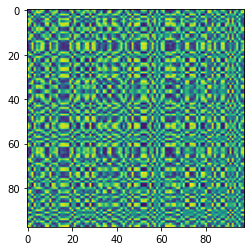

Epoch: 21, Loss: 0.2590, Test Acc: 0.1743
Epoch: 22, Loss: 0.2579, Test Acc: 0.1793
Epoch: 23, Loss: 0.2576, Test Acc: 0.1773
Epoch: 24, Loss: 0.2576, Test Acc: 0.1762
Epoch: 25, Loss: 0.2577, Test Acc: 0.1738
Epoch: 26, Loss: 0.2569, Test Acc: 0.1825
Epoch: 27, Loss: 0.2561, Test Acc: 0.1792
Epoch: 28, Loss: 0.2579, Test Acc: 0.1727
Epoch: 29, Loss: 0.2569, Test Acc: 0.1779
Epoch: 30, Loss: 0.2561, Test Acc: 0.1784


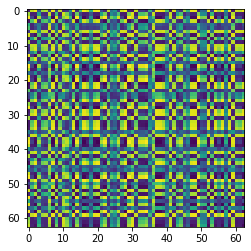

Epoch: 31, Loss: 0.2570, Test Acc: 0.1808
Epoch: 32, Loss: 0.2566, Test Acc: 0.1759
Epoch: 33, Loss: 0.2553, Test Acc: 0.1833
Epoch: 34, Loss: 0.2566, Test Acc: 0.1788
Epoch: 35, Loss: 0.2555, Test Acc: 0.1848
Epoch: 36, Loss: 0.2561, Test Acc: 0.1806
Epoch: 37, Loss: 0.2565, Test Acc: 0.1863
Epoch: 38, Loss: 0.2561, Test Acc: 0.1840
Epoch: 39, Loss: 0.2556, Test Acc: 0.1773
Epoch: 40, Loss: 0.2543, Test Acc: 0.1825


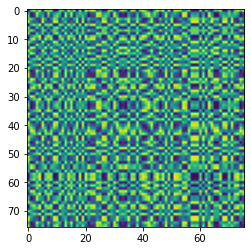

Epoch: 41, Loss: 0.2551, Test Acc: 0.1675
Epoch: 42, Loss: 0.2555, Test Acc: 0.1815
Epoch: 43, Loss: 0.2539, Test Acc: 0.1792
Epoch: 44, Loss: 0.2555, Test Acc: 0.1790
Epoch: 45, Loss: 0.2534, Test Acc: 0.1873
Epoch: 46, Loss: 0.2546, Test Acc: 0.1842
Epoch: 47, Loss: 0.2540, Test Acc: 0.1845
Epoch: 48, Loss: 0.2547, Test Acc: 0.1803
Epoch: 49, Loss: 0.2541, Test Acc: 0.1829
Epoch: 50, Loss: 0.2551, Test Acc: 0.1788


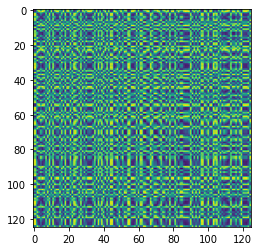

Epoch: 51, Loss: 0.2548, Test Acc: 0.1796
Epoch: 52, Loss: 0.2541, Test Acc: 0.1791
Epoch: 53, Loss: 0.2533, Test Acc: 0.1820
Epoch: 54, Loss: 0.2546, Test Acc: 0.1832
Epoch: 55, Loss: 0.2531, Test Acc: 0.1872
Epoch: 56, Loss: 0.2541, Test Acc: 0.1815
Epoch: 57, Loss: 0.2529, Test Acc: 0.1840
Epoch: 58, Loss: 0.2534, Test Acc: 0.1801
Epoch: 59, Loss: 0.2523, Test Acc: 0.1808
Epoch: 60, Loss: 0.2529, Test Acc: 0.1829


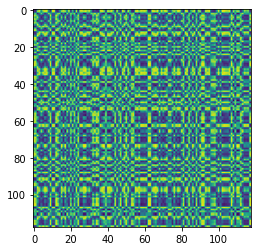

Epoch: 61, Loss: 0.2520, Test Acc: 0.1899
Epoch: 62, Loss: 0.2531, Test Acc: 0.1846
Epoch: 63, Loss: 0.2519, Test Acc: 0.1868
Epoch: 64, Loss: 0.2521, Test Acc: 0.1909
Epoch: 65, Loss: 0.2512, Test Acc: 0.1812
Epoch: 66, Loss: 0.2515, Test Acc: 0.1832
Epoch: 67, Loss: 0.2521, Test Acc: 0.1845
Epoch: 68, Loss: 0.2515, Test Acc: 0.1785
Epoch: 69, Loss: 0.2514, Test Acc: 0.1802
Epoch: 70, Loss: 0.2516, Test Acc: 0.1863


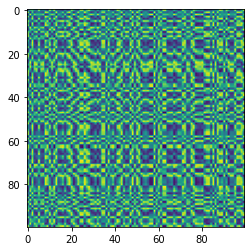

Epoch: 71, Loss: 0.2507, Test Acc: 0.1887
Epoch: 72, Loss: 0.2510, Test Acc: 0.1819
Epoch: 73, Loss: 0.2515, Test Acc: 0.1781
Epoch: 74, Loss: 0.2523, Test Acc: 0.1854
Epoch: 75, Loss: 0.2527, Test Acc: 0.1868
Epoch: 76, Loss: 0.2511, Test Acc: 0.1835
Epoch: 77, Loss: 0.2497, Test Acc: 0.1894
Epoch: 78, Loss: 0.2495, Test Acc: 0.1857
Epoch: 79, Loss: 0.2493, Test Acc: 0.1828
Epoch: 80, Loss: 0.2523, Test Acc: 0.1801


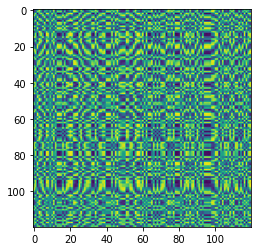

Epoch: 81, Loss: 0.2504, Test Acc: 0.1798
Epoch: 82, Loss: 0.2500, Test Acc: 0.1847
Epoch: 83, Loss: 0.2509, Test Acc: 0.1881
Epoch: 84, Loss: 0.2512, Test Acc: 0.1817
Epoch: 85, Loss: 0.2513, Test Acc: 0.1926
Epoch: 86, Loss: 0.2504, Test Acc: 0.1893
Epoch: 87, Loss: 0.2494, Test Acc: 0.1893
Epoch: 88, Loss: 0.2510, Test Acc: 0.1877
Epoch: 89, Loss: 0.2511, Test Acc: 0.1856
Epoch: 90, Loss: 0.2506, Test Acc: 0.1778


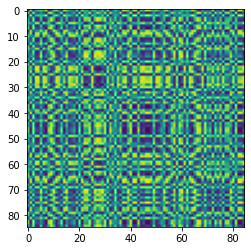

Epoch: 91, Loss: 0.2510, Test Acc: 0.1788
Epoch: 92, Loss: 0.2498, Test Acc: 0.1816
Epoch: 93, Loss: 0.2492, Test Acc: 0.1876
Epoch: 94, Loss: 0.2494, Test Acc: 0.1863
Epoch: 95, Loss: 0.2502, Test Acc: 0.1852
Epoch: 96, Loss: 0.2502, Test Acc: 0.1948
Epoch: 97, Loss: 0.2497, Test Acc: 0.1944
Epoch: 98, Loss: 0.2489, Test Acc: 0.1839
Epoch: 99, Loss: 0.2497, Test Acc: 0.1872


In [55]:
n_epoch =100
margin = 1
optimizer = optim.Adam(GraphModel.parameters(), lr=5e-6)

def train(model, optimizer, loader):
    model.train()
    
    total_loss = 0
    for data in loader:
        optimizer.zero_grad()  # Clear gradients.
        
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)

        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #print(loss.item())
                
        loss.backward()  # Backward pass.
        optimizer.step()  # Update model parameters.
        total_loss += loss.item() * data.num_graphs

    return total_loss / len(loader), pmatrix

@torch.no_grad()
def test(model, loader):
    model.eval()
    
    total_correct = 0
    for data in loader:
        #print(data)
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)
        
        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #total_loss += loss.item() * data.num_graphs
        row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
        num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
        test_acc = num_match / data.pos.shape[0]
        total_correct += test_acc

    return total_correct / len(loader)


for epoch in range(0, n_epoch):
    loss, pmatrix = train(GraphModel, optimizer, train_loader)
    test_acc = test(GraphModel, test_loader)
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Test Acc: {test_acc:.4f}')

    if epoch %10 == 0:
        plt.imshow(pmatrix.detach().cpu().numpy())
        plt.show()


In [56]:
for test_data in test_dataset:
    #print(test_data)
    origin_output = GraphModel(test_data.pos, test_data.edge_index)
    transform_output = GraphModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
    num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
    test_acc = num_match / test_data.pos.shape[0]
    print(test_acc)

tensor(0.1324)
tensor(0.0098)
tensor(0.2673)
tensor(0.1624)
tensor(0.0242)
tensor(0.4257)
tensor(0.3025)
tensor(0.2018)
tensor(0.3704)
tensor(0.0720)
tensor(0.0909)
tensor(0.1111)
tensor(0.2826)
tensor(0.0813)
tensor(0.3684)
tensor(0.3299)
tensor(0.1371)
tensor(0.0174)
tensor(0.1545)
tensor(0.2308)
tensor(0.1339)
tensor(0.1538)
tensor(0.2018)
tensor(0.1463)
tensor(0.2901)
tensor(0.3059)
tensor(0.1880)
tensor(0.1119)
tensor(0.2597)
tensor(0.4071)
tensor(0.0702)
tensor(0.3981)
tensor(0.0394)
tensor(0.0991)
tensor(0.0449)
tensor(0.0727)
tensor(0.2167)
tensor(0.0970)
tensor(0.2448)
tensor(0.2109)
tensor(0.2523)
tensor(0.2609)
tensor(0.1532)
tensor(0.0379)
tensor(0.1964)
tensor(0.3197)
tensor(0.1148)


In [57]:
total_acc = 0
for test_data in test_dataset:
    origin_output = GraphModel(test_data.pos, test_data.edge_index)
    transform_output = GraphModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    match = torch.argmin(pmatrix, 0)
    num_match = 0
    for i in range(len(match)):
        if match[i] == i:
            num_match += 1
    test_acc = num_match / test_data.pos.shape[0]
    total_acc += test_acc
    print(test_acc)
mean_acc = total_acc/len(test_dataset)
print("mean_acc", mean_acc)

0.051470588235294115
0.00980392156862745
0.039603960396039604
0.07692307692307693
0.008064516129032258
0.10891089108910891
0.01680672268907563
0.09174311926605505
0.23148148148148148
0.064
0.008264462809917356
0.02564102564102564
0.15217391304347827
0.0
0.10526315789473684
0.16494845360824742
0.10483870967741936
0.017391304347826087
0.17272727272727273
0.08791208791208792
0.017857142857142856
0.1623931623931624
0.14035087719298245
0.016260162601626018
0.10687022900763359
0.12941176470588237
0.05263157894736842
0.05970149253731343
0.07792207792207792
0.18584070796460178
0.03508771929824561
0.3106796116504854
0.023622047244094488
0.04504504504504504
0.011235955056179775
0.00909090909090909
0.11666666666666667
0.05223880597014925
0.04895104895104895
0.109375
0.06542056074766354
0.14782608695652175
0.06306306306306306
0.022727272727272728
0.017857142857142856
0.14754098360655737
0.02459016393442623
mean_acc 0.07953672222202268


In [58]:
print(pmatrix[0])

tensor([0.0564, 1.7410, 0.2146, 1.8781, 0.3963, 1.7021, 0.7855, 1.2393, 1.1909,
        1.3051, 0.1962, 1.6724, 1.3271, 1.4537, 1.7102, 0.6031, 0.6633, 1.5720,
        0.5501, 0.0657, 0.3916, 1.0378, 1.7913, 0.5444, 1.7469, 1.2029, 1.7296,
        1.6304, 0.4955, 1.5138, 0.0939, 0.1059, 1.2120, 1.2027, 0.0780, 1.7277,
        0.6187, 1.1257, 1.8624, 1.7262, 1.3460, 0.3604, 0.1785, 1.3726, 1.3465,
        0.9656, 0.1719, 0.1282, 1.1667, 0.9645, 0.2564, 0.2622, 1.2487, 0.4598,
        0.0764, 0.0681, 1.6016, 0.7501, 1.8216, 1.8272, 1.1428, 0.8304, 1.8671,
        1.1675, 1.7073, 0.2118, 0.6753, 1.5111, 0.0611, 0.3083, 0.2755, 0.3173,
        1.3686, 1.4145, 0.8153, 1.0546, 1.4751, 1.2350, 1.3311, 1.7322, 1.7096,
        1.8404, 0.9963, 1.7427, 1.7443, 1.4402, 0.7154, 1.3357, 0.0554, 1.6213,
        1.7355, 0.3442, 0.8780, 1.6156, 1.1548, 1.6218, 1.5661, 1.3123, 0.8958,
        1.8777, 1.2994, 0.4045, 0.7575, 1.2999, 1.3052, 0.9082, 1.6488, 1.3050,
        0.2919, 0.2686, 0.1059, 1.0280, 

In [59]:
#save the model
PATH = "/home/melina/桌面/jupyter/intellisys/week5/models/Graphmodel_1.p"
torch.save(GraphModel.state_dict(),PATH)

### 2.4 GNN with PPFConv

In [11]:
from torch_geometric.nn import PPFConv

from torch.nn import Sequential, Linear, ReLU


class PPFGCN(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(PPFGCN, self).__init__()
        torch.manual_seed(1234567)
        self.local_sequential = Sequential(
            Linear(in_channels, out_channels),
            ReLU(),
            Linear(out_channels, out_channels),
            ReLU(),
            Linear(out_channels, out_channels)
        )
        self.global_sequential = Sequential(
            Linear(out_channels, out_channels),
            ReLU(),
            Linear(out_channels, out_channels),
            ReLU(),
            Linear(out_channels, out_channels)
        )
        self.conv1 = PPFConv(local_nn = self.local_sequential, global_nn = self.global_sequential)

    def forward(self, x, edge_index):
        x = self.conv1(x = x, pos = x, normal = x, edge_index = edge_index)
        return x

PPFModel = PPFGCN(in_channels= 3+4, out_channels=512)
print(PPFModel)

PPFGCN(
  (local_sequential): Sequential(
    (0): Linear(in_features=7, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
  )
  (global_sequential): Sequential(
    (0): Linear(in_features=512, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
  )
  (conv1): PPFConv(local_nn=Sequential(
    (0): Linear(in_features=7, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
  ), global_nn=Sequential(
    (0): Linear(in_features=512, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_featu

Epoch: 00, Loss: 0.0679, Test Acc: 0.8149


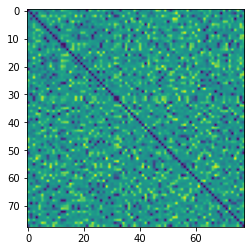

Epoch: 01, Loss: 0.0677, Test Acc: 0.8101
Epoch: 02, Loss: 0.0678, Test Acc: 0.8097
Epoch: 03, Loss: 0.0678, Test Acc: 0.8125
Epoch: 04, Loss: 0.0676, Test Acc: 0.8131
Epoch: 05, Loss: 0.0676, Test Acc: 0.8005
Epoch: 06, Loss: 0.0674, Test Acc: 0.8106
Epoch: 07, Loss: 0.0668, Test Acc: 0.8063
Epoch: 08, Loss: 0.0669, Test Acc: 0.8076
Epoch: 09, Loss: 0.0668, Test Acc: 0.8189
Epoch: 10, Loss: 0.0665, Test Acc: 0.8164


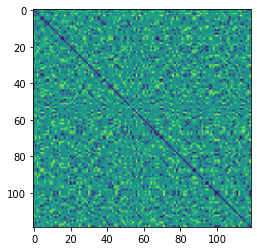

Epoch: 11, Loss: 0.0662, Test Acc: 0.8145
Epoch: 12, Loss: 0.0664, Test Acc: 0.8135
Epoch: 13, Loss: 0.0662, Test Acc: 0.8131
Epoch: 14, Loss: 0.0662, Test Acc: 0.8184
Epoch: 15, Loss: 0.0660, Test Acc: 0.8155
Epoch: 16, Loss: 0.0658, Test Acc: 0.8151
Epoch: 17, Loss: 0.0661, Test Acc: 0.8276
Epoch: 18, Loss: 0.0659, Test Acc: 0.8255
Epoch: 19, Loss: 0.0655, Test Acc: 0.8180
Epoch: 20, Loss: 0.0655, Test Acc: 0.8211


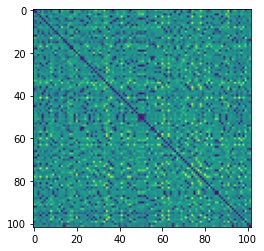

Epoch: 21, Loss: 0.0654, Test Acc: 0.8276
Epoch: 22, Loss: 0.0654, Test Acc: 0.8107
Epoch: 23, Loss: 0.0654, Test Acc: 0.8188
Epoch: 24, Loss: 0.0651, Test Acc: 0.8218
Epoch: 25, Loss: 0.0651, Test Acc: 0.8147
Epoch: 26, Loss: 0.0648, Test Acc: 0.8242
Epoch: 27, Loss: 0.0651, Test Acc: 0.8280
Epoch: 28, Loss: 0.0648, Test Acc: 0.8247
Epoch: 29, Loss: 0.0648, Test Acc: 0.8278
Epoch: 30, Loss: 0.0645, Test Acc: 0.8291


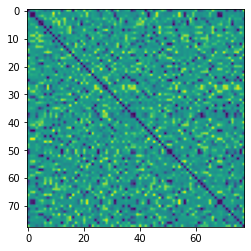

Epoch: 31, Loss: 0.0643, Test Acc: 0.8265
Epoch: 32, Loss: 0.0643, Test Acc: 0.8331
Epoch: 33, Loss: 0.0650, Test Acc: 0.8364
Epoch: 34, Loss: 0.0642, Test Acc: 0.8294
Epoch: 35, Loss: 0.0641, Test Acc: 0.8306
Epoch: 36, Loss: 0.0641, Test Acc: 0.8371
Epoch: 37, Loss: 0.0641, Test Acc: 0.8344
Epoch: 38, Loss: 0.0642, Test Acc: 0.8203
Epoch: 39, Loss: 0.0639, Test Acc: 0.8269
Epoch: 40, Loss: 0.0635, Test Acc: 0.8231


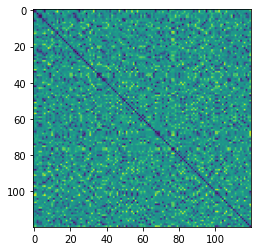

Epoch: 41, Loss: 0.0634, Test Acc: 0.8299
Epoch: 42, Loss: 0.0631, Test Acc: 0.8330
Epoch: 43, Loss: 0.0633, Test Acc: 0.8358
Epoch: 44, Loss: 0.0633, Test Acc: 0.8368
Epoch: 45, Loss: 0.0633, Test Acc: 0.8415
Epoch: 46, Loss: 0.0628, Test Acc: 0.8282
Epoch: 47, Loss: 0.0626, Test Acc: 0.8383
Epoch: 48, Loss: 0.0631, Test Acc: 0.8329
Epoch: 49, Loss: 0.0625, Test Acc: 0.8345
Epoch: 50, Loss: 0.0627, Test Acc: 0.8343


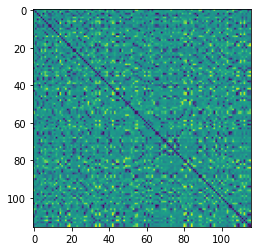

Epoch: 51, Loss: 0.0634, Test Acc: 0.8292
Epoch: 52, Loss: 0.0628, Test Acc: 0.8384
Epoch: 53, Loss: 0.0625, Test Acc: 0.8395
Epoch: 54, Loss: 0.0622, Test Acc: 0.8297
Epoch: 55, Loss: 0.0625, Test Acc: 0.8463
Epoch: 56, Loss: 0.0626, Test Acc: 0.8282
Epoch: 57, Loss: 0.0619, Test Acc: 0.8250
Epoch: 58, Loss: 0.0620, Test Acc: 0.8202
Epoch: 59, Loss: 0.0619, Test Acc: 0.8400
Epoch: 60, Loss: 0.0617, Test Acc: 0.8401


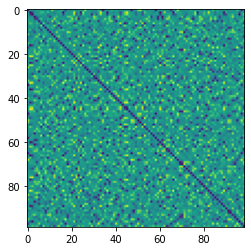

Epoch: 61, Loss: 0.0620, Test Acc: 0.8389
Epoch: 62, Loss: 0.0616, Test Acc: 0.8483
Epoch: 63, Loss: 0.0612, Test Acc: 0.8419
Epoch: 64, Loss: 0.0613, Test Acc: 0.8327
Epoch: 65, Loss: 0.0611, Test Acc: 0.8429
Epoch: 66, Loss: 0.0611, Test Acc: 0.8341
Epoch: 67, Loss: 0.0611, Test Acc: 0.8368
Epoch: 68, Loss: 0.0610, Test Acc: 0.8373
Epoch: 69, Loss: 0.0604, Test Acc: 0.8436
Epoch: 70, Loss: 0.0608, Test Acc: 0.8373


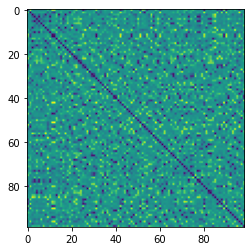

Epoch: 71, Loss: 0.0607, Test Acc: 0.8458
Epoch: 72, Loss: 0.0609, Test Acc: 0.8362
Epoch: 73, Loss: 0.0607, Test Acc: 0.8390
Epoch: 74, Loss: 0.0598, Test Acc: 0.8269
Epoch: 75, Loss: 0.0603, Test Acc: 0.8411
Epoch: 76, Loss: 0.0602, Test Acc: 0.8442
Epoch: 77, Loss: 0.0598, Test Acc: 0.8398
Epoch: 78, Loss: 0.0604, Test Acc: 0.8375
Epoch: 79, Loss: 0.0600, Test Acc: 0.8467
Epoch: 80, Loss: 0.0598, Test Acc: 0.8434


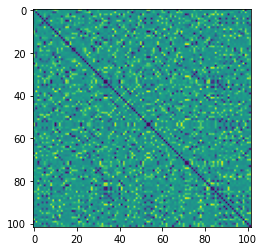

Epoch: 81, Loss: 0.0597, Test Acc: 0.8418
Epoch: 82, Loss: 0.0593, Test Acc: 0.8458
Epoch: 83, Loss: 0.0593, Test Acc: 0.8440
Epoch: 84, Loss: 0.0593, Test Acc: 0.8423
Epoch: 85, Loss: 0.0593, Test Acc: 0.8512
Epoch: 86, Loss: 0.0591, Test Acc: 0.8479
Epoch: 87, Loss: 0.0591, Test Acc: 0.8433
Epoch: 88, Loss: 0.0590, Test Acc: 0.8550
Epoch: 89, Loss: 0.0591, Test Acc: 0.8518
Epoch: 90, Loss: 0.0587, Test Acc: 0.8454


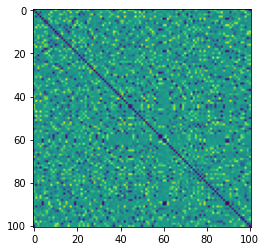

Epoch: 91, Loss: 0.0592, Test Acc: 0.8424
Epoch: 92, Loss: 0.0588, Test Acc: 0.8555
Epoch: 93, Loss: 0.0589, Test Acc: 0.8495
Epoch: 94, Loss: 0.0584, Test Acc: 0.8571
Epoch: 95, Loss: 0.0585, Test Acc: 0.8410
Epoch: 96, Loss: 0.0580, Test Acc: 0.8529
Epoch: 97, Loss: 0.0581, Test Acc: 0.8515
Epoch: 98, Loss: 0.0582, Test Acc: 0.8519
Epoch: 99, Loss: 0.0583, Test Acc: 0.8433


In [14]:
n_epoch =100
margin = 1
optimizer = optim.Adam(PPFModel.parameters(), lr=5e-6)

def train(model, optimizer, loader):
    model.train()
    
    total_loss = 0
    for data in loader:
        optimizer.zero_grad()  # Clear gradients.
        
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)

        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #print(loss.item())
                
        loss.backward()  # Backward pass.
        optimizer.step()  # Update model parameters.
        total_loss += loss.item() * data.num_graphs

    return total_loss / len(loader), pmatrix

@torch.no_grad()
def test(model, loader):
    model.eval()
    
    total_correct = 0
    for data in loader:
        #compute the embeddings
        origin_output = model(data.pos, data.edge_index)
        transform_output = model(data.pos_tr, data.edge_index)
        
        loss, pmatrix =  contrastive_loss(origin_output, transform_output)
        #total_loss += loss.item() * data.num_graphs
        row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
        num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
        test_acc = num_match / data.pos.shape[0]
        total_correct += test_acc

    return total_correct / len(loader)


for epoch in range(0, n_epoch):
    loss, pmatrix = train(PPFModel, optimizer, train_loader)
    test_acc = test(PPFModel, test_loader)
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Test Acc: {test_acc:.4f}')

    if epoch %10 == 0:
        plt.imshow(pmatrix.detach().cpu().numpy())
        plt.show()


In [15]:
for test_data in test_dataset:
    origin_output = PPFModel(test_data.pos, test_data.edge_index)
    transform_output = PPFModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    row_idx, col_idx = linear_assignment(pmatrix.detach().numpy())
    num_match = torch.sum(torch.where(torch.tensor(row_idx) == torch.tensor(col_idx),1,0))
    test_acc = num_match / test_data.pos.shape[0]
    print(test_acc)

tensor(0.9044)
tensor(0.8431)
tensor(0.8614)
tensor(0.7692)
tensor(0.7903)
tensor(0.8119)
tensor(0.8067)
tensor(0.6147)
tensor(0.9259)
tensor(0.8880)
tensor(0.7851)
tensor(0.9487)
tensor(0.9348)
tensor(0.9512)
tensor(0.9737)
tensor(0.8041)
tensor(0.8871)
tensor(0.8522)
tensor(0.9273)
tensor(0.6374)
tensor(0.9107)
tensor(0.9145)
tensor(0.9035)
tensor(0.7886)
tensor(0.9389)
tensor(0.8824)
tensor(0.8120)
tensor(0.7537)
tensor(0.7013)
tensor(0.9292)
tensor(0.7719)
tensor(0.9223)
tensor(0.9213)
tensor(0.6667)
tensor(0.8652)
tensor(0.9000)
tensor(0.8750)
tensor(0.8284)
tensor(0.6853)
tensor(0.8984)
tensor(0.8879)
tensor(0.9130)
tensor(0.7658)
tensor(0.8182)
tensor(0.8571)
tensor(0.8197)
tensor(0.7869)


In [ ]:
print(pmatrix[0])

In [16]:
total_acc = 0
for test_data in test_dataset:
    origin_output = PPFModel(test_data.pos, test_data.edge_index)
    transform_output = PPFModel(test_data.pos_tr, test_data.edge_index)
    pmatrix =  cosine_distance(origin_output, transform_output)
    match = torch.argmin(pmatrix, 0)
    num_match = 0
    for i in range(len(match)):
        if match[i] == i:
            num_match += 1
    test_acc = num_match / test_data.pos.shape[0]
    total_acc += test_acc
    print(test_acc)
mean_acc = total_acc/len(test_dataset)
print("mean_acc", mean_acc)

0.6176470588235294
0.7156862745098039
0.6237623762376238
0.6581196581196581
0.6612903225806451
0.6633663366336634
0.6638655462184874
0.5321100917431193
0.7129629629629629
0.648
0.6611570247933884
0.7264957264957265
0.717391304347826
0.7317073170731707
0.7763157894736842
0.7319587628865979
0.6854838709677419
0.6521739130434783
0.6363636363636364
0.6593406593406593
0.7321428571428571
0.7863247863247863
0.6754385964912281
0.6585365853658537
0.6793893129770993
0.6470588235294118
0.6541353383458647
0.6194029850746269
0.6493506493506493
0.7168141592920354
0.5964912280701754
0.7961165048543689
0.7244094488188977
0.5585585585585585
0.7191011235955056
0.6909090909090909
0.6416666666666667
0.6119402985074627
0.5454545454545454
0.6953125
0.8037383177570093
0.8
0.6936936936936937
0.6666666666666666
0.5982142857142857
0.6147540983606558
0.6557377049180327
mean_acc 0.6746076055118175


In [17]:
#save the model
PATH = "/home/melina/桌面/jupyter/intellisys/week5/models/PPFmodel_2.p"
torch.save(PPFModel.state_dict(),PATH)